# Digital Image Processing (CSE/ECE 478) Monsoon-2019

Solutions for DIP Assignment-2 on

1. Comaprision of Edge Detection filters
1. Unsharp Masking and LoG
1. Edge detection custom filter
1. High Boost 
1. Lowpass filter
1. Bilateral Filtering
1. Applications of Bilateral Filter
1. Image Restoration

### Importing dependency libraries

In [1]:
import numpy as np
import cv2
import os,sys
from matplotlib import pyplot as plt
from operator import itemgetter
from mpl_toolkits.axes_grid1 import make_axes_locatable
from sklearn.cluster import KMeans
from collections import Counter
from numpy.lib.stride_tricks import as_strided
import time

%matplotlib inline

### Utility functions

In [2]:
def getColorSpaces(image):
    rgb = cv2.cvtColor(image,cv2.COLOR_RGB2BGR)
    gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
    
    return rgb,gray

def getImageDimnesion(image):
    height,width = image.shape[:2]
    
    return height,width

def showImage(image,title,cmap):
    plt.imshow(image,cmap=cmap)
    plt.axis('off')
    plt.title(title)


def splitRGBChannels(image):
  red, green, blue= cv2.split(img)
  
  return red, green, blue

def getNormalizedImage(image):
    norm_image=image.copy()
    norm_image = np.maximum(norm_image, np.zeros(norm_image.shape))
    norm_image = np.minimum(norm_image, 255 * np.ones(norm_image.shape))
    norm_image = norm_image.round().astype(np.uint8)
    
    return norm_image

def applyLaplacian(gray,kernel_size):
    # Apply Gaussian Blur
    sigma=1.0
      
    blur = cv2.GaussianBlur(gray,(kernel_size,kernel_size),sigma)
    
    #Apply the laplacian now
    laplacian = cv2.Laplacian(blur,cv2.CV_16S,ksize=3)
    laplacian = np.maximum(laplacian, np.zeros(laplacian.shape))
    laplacian = np.minimum(laplacian, 255 * np.ones(laplacian.shape))
    laplacian = laplacian.round().astype(np.uint8)
    
    return laplacian

def getHistogram(image, bins=256):
    
    image_pixels=image.flatten()
    # array with size of bins, set to zeros
    histogram = np.zeros(bins)
    
    # loop through pixels and sum up counts of pixels
    for pixel in image_pixels:
        histogram[pixel] += 1
    
    # return our final result
    return histogram

'''

Implement high-boost filtering on the image bell.jpg varying the window size and
the weight factor and report your observations.

 Edges = Original - LoG


Unsharp Mask
 High pass/Edges= Original - Low Pass (Gaussian,average etc)
 Sharp Image =Original+ k*Edges


High Boost = A*Original- Low Pass
             =A*Original-Original+Original- Low Pass
             =Original*(A-1)+(Original- Low Pass)
             =(A-1)*Original+High Pass
         
'''

def applyUnsharp(image, kernel_size=(5, 5)):
    """Return a sharpened version of the image, using an unsharp mask."""
    k=1.0
    sigma=1.0
    blurred = cv2.GaussianBlur(image, kernel_size, sigma) #Lowpass
    sharpened = float(k + 1) * image - float(k) * blurred #gmask
    sharpened =getNormalizedImage(sharpened)

    return sharpened

def getResizedImage(img,scale_percent = 50 ):
    
    # percent of original size
    width = int(img.shape[1] * scale_percent / 100)
    height = int(img.shape[0] * scale_percent / 100)
    dim = (width, height)
    # resize image
    resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
    
    return resized    


def getPaddedImage(image,pad,channels,data_type):
   
    if channels==3:    
        return  np.pad(image, ((pad, pad), (pad, pad), (0, 0)), 'symmetric').astype(data_type)
       
    else:
        return np.pad(image, ((pad, pad), (pad, pad)), 'symmetric').astype(data_type)
    


 # <center>Question 1 -Edge Detection </center>

### 1.  Apply the Canny edge detector(use cv2.Canny or MATLAB's edge function) to bell.jpg and cubes.png. Tweak the values of the arguments(minVal and maxVal), and report the values that give the best results for each image.Hint: For the bell image, try to detect as many edges in the bell as possible, while avoiding edges in the background.

Canny edge detection using default values

In [3]:
def displayEdges(rgb,edges):   
    plt.subplot(121),plt.imshow(rgb)
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(edges,cmap = 'gray')
    plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
    plt.show()    

In [4]:
def getEdges_Default(gray,low,high):
    edges = cv2.Canny(gray,low,high)
    return edges

'''
 We set the low threshold to 0.66*[mean value] and set the high threshold to 1.33*[mean value]
'''
def getEdges_Mean(gray):
    min_threshold = 0.66 *np.mean(gray)
    max_threshold = 1.33 *np.mean(gray)
    edges = cv2.Canny(gray,min_threshold,max_threshold)    
    return edges
'''
 We set the low threshold to 0.66*[median value] and set the high threshold to 1.33*[median value]
'''
def getEdges_Median(gray):
    min_threshold = 0.66 *np.median(gray)
    max_threshold = 1.33 *np.median(gray)
    edges = cv2.Canny(gray,min_threshold,max_threshold)    
    return edges    

def getEdges_OTSU(gray):
    ret2,th2 = cv2.threshold(gray,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    blur = cv2.GaussianBlur(gray,(3,3),0)
    max_threshold=ret2
    min_threshold=0.5*max_threshold
    edges = cv2.Canny(blur,min_threshold,max_threshold)
    
    return edges



Canny edge detection using default values


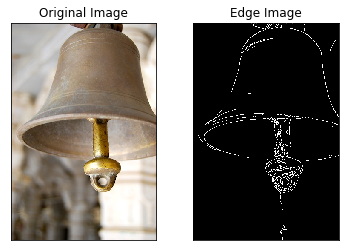

Canny edge detection using MEAN value auto-thresholding


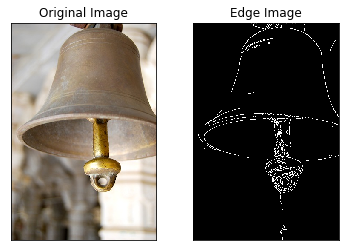

Canny edge detection using MEDIAN value auto-thresholding


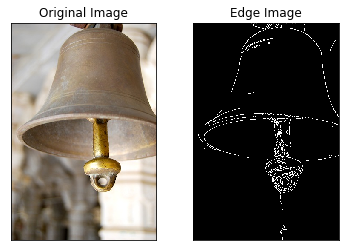

In [5]:
img = cv2.imread('input_data/bell.jpg')
rgb,gray=getColorSpaces(img)

print('Canny edge detection using default values')
edges=getEdges_Default(gray,100,200)
displayEdges(rgb,edges)

print('Canny edge detection using MEAN value auto-thresholding')
edges=getEdges_Mean(gray)
displayEdges(rgb,edges)

print('Canny edge detection using MEDIAN value auto-thresholding')
edges=getEdges_Median(gray)
displayEdges(rgb,edges)

1. Canny recommended a upper:lower ratio between 2:1 and 3:1 ..Therfore I used (100,200) as default experiment
1. Mean and Median auto-thresholding have given almost similar output and have more edges than default values

In an alternative way , I have Image ***sharpening*** technique.Image sharpening refers to any enhancement technique that 
**highlights edges** and fine details in an image. 
1. Edges detected by sharpening the bell.jpg image are more and within the bell region predominantly when compared to previous ones

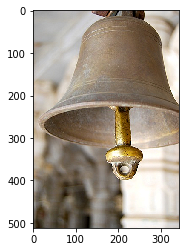

Canny edge detection using MEDIAN value auto-thresholding on Sharpened image


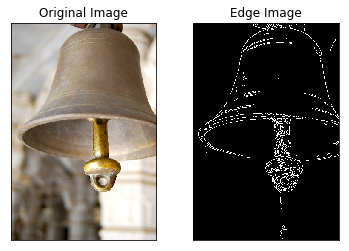

In [6]:
#Image sharpening
sharpened_image = applyUnsharp(rgb)
plt.imshow(sharpened_image)
plt.show()

#Get gray compnent of the sharpened image
_,gray=getColorSpaces(sharpened_image)

print('Canny edge detection using MEDIAN value auto-thresholding on Sharpened image')
edges=getEdges_Median(gray)
displayEdges(rgb,edges)

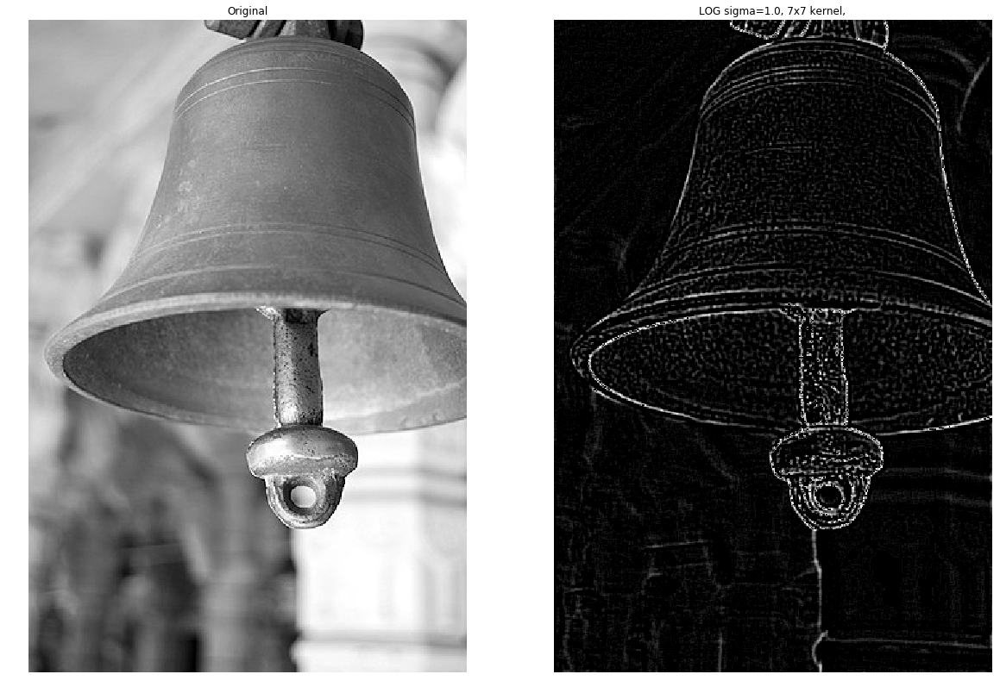

In [7]:
gray_minus_laplacian=gray-applyLaplacian(gray,7)

unsharp_mask_image=applyUnsharp(gray)

laplacian=applyLaplacian(gray,7)
plt.figure(figsize=(20, 20))

plt.subplot(1,2,1)
plt.axis('off')
plt.title('Original')
plt.imshow(gray,cmap='gray')

#Edges are identified
plt.subplot(1,2,2)
plt.axis('off')
plt.title('LOG sigma=1.0, 7x7 kernel,')
plt.imshow(3*laplacian,cmap='gray')

Canny edge detection using default values


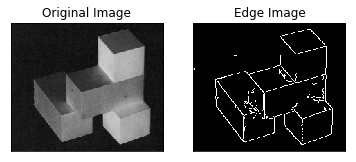

Canny edge detection using MEAN value auto-thresholding


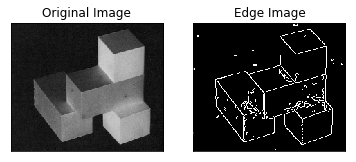

Canny edge detection using MEDIAN value auto-thresholding


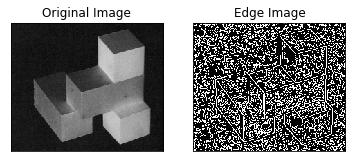

Canny edge detection using Gaussian blur and OTSU’s threshold parameter


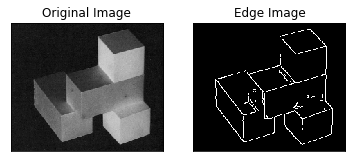

In [8]:
img = cv2.imread('input_data/cubes.png')
rgb,gray=getColorSpaces(img)

print('Canny edge detection using default values')
edges=getEdges_Default(gray,50,100)
displayEdges(rgb,edges)

print('Canny edge detection using MEAN value auto-thresholding')
edges=getEdges_Mean(gray)
displayEdges(rgb,edges)

print('Canny edge detection using MEDIAN value auto-thresholding')
edges=getEdges_Median(gray)
displayEdges(rgb,edges)

print('Canny edge detection using Gaussian blur and OTSU’s threshold parameter')
edges=getEdges_OTSU(gray)
displayEdges(rgb,edges)

1. Canny recommended a upper:lower ratio between 2:1 and 3:1 ..Therfore I used (50,100) as default experiment
1. Mean and Median auto-thresholding have dissimilar output for cubes.png image
1. Achieve a good result by using gaussian blur followed by OTSU’s threshold parameter for cubes.png

### 2. Consider Roberts, Prewitt, and Sobel lters and Laplacian lters. Apply these filters on barbara.jpg and make observations upon comparing their outputs. Compare these with the output of Canny edge detector on the same image.

In [11]:
def applyPrewitt(gray):
    
    filterX = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
    filterY= np.array([[1,1,1],[0,0,0],[-1,-1,-1]])
    
    img_X = cv2.filter2D(gray, -1, filterX)
    img_Y = cv2.filter2D(gray, -1, filterY)
    
    return img_X+img_Y

def applySobel(gray):
    
    filterX = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
    filterY= np.array([[1,2,1],[0,0,0],[-1,-2,-1]])
    
    img_X = cv2.filter2D(gray, -1, filterX)
    img_Y = cv2.filter2D(gray, -1, filterY)
    
    return img_X+img_Y

def applyRoberts(gray):
    
    filterX = np.array([[0,1],[-1,0]])
    filterY = np.array([[1,0],[0,-1]])
    img_X = cv2.filter2D(gray, -1, filterX)
    img_Y = cv2.filter2D(gray, -1, filterY)
    
    return img_X+img_Y

def applyLaplacian(gray):
    
    filterX = np.array([[0,1,0],[1,-4,1],[0,1,0]])
    filterY = np.array([[1,1,1],[1,-8,1],[1,1,1]])
    img_X = cv2.filter2D(gray, -1, filterX)
    img_Y = cv2.filter2D(gray, -1, filterY)
    
    return img_X+img_Y

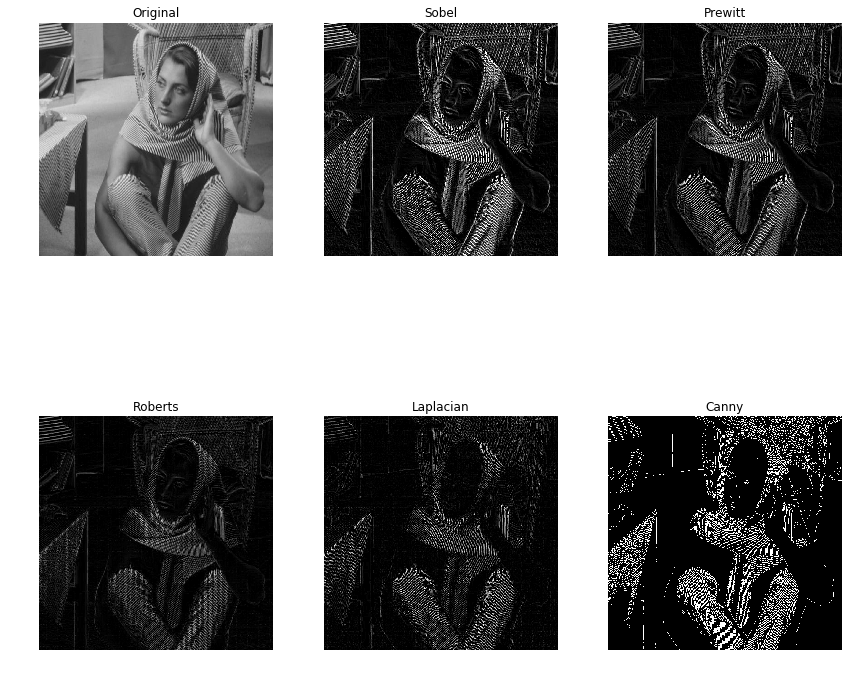

In [12]:
img = cv2.imread(r'./input_data/barbara.jpg')
plt.figure(figsize=(12, 12))
rgb,gray=getColorSpaces(img)

plt.subplot(2,3,1)
plt.axis('off')
plt.title('Original')
plt.imshow(rgb)

plt.subplot(2,3,2)
plt.axis('off')
plt.title('Sobel')
plt.imshow(applySobel(gray),cmap='gray')

plt.subplot(2,3,3)
plt.axis('off')
plt.title('Prewitt')
plt.imshow(applyPrewitt(gray),cmap='gray')

plt.subplot(2,3,4)
plt.axis('off')
plt.title('Roberts')
plt.imshow(applyRoberts(gray),cmap='gray')

plt.subplot(2,3,5)
plt.axis('off')
plt.title('Laplacian')
plt.imshow(applyLaplacian(gray),cmap='gray')

plt.subplot(2,3,6)
plt.axis('off')
plt.title('Canny')
plt.imshow(getEdges_Mean(gray),cmap='gray')

plt.tight_layout()
plt.show()


1. The Sobel edge enhancement filter has the advantage of providing differentiating (which gives the edge response) and smoothing (which reduces noise) concurrently.
1. Laplacian is sensitive to noise - observe between table and the arm and below elbow.To overcome this image is often Gaussian smoothed before applying the Laplacian filter


### 3.  Add noise to the input image above using Gaussian sampling. Study the effect of applying the filters on noise-affected inputs.

In [13]:
def addGaussianNoise(gray):
    row,col= gray.shape
    mean = 0
    var = 0.1
    sigma = var**0.5
    gaussian = np.random.normal(mean,sigma,(row,col))
    noisy_image = np.zeros(gray.shape, np.float32)
    noisy_image = gray + gaussian    
    cv2.normalize(noisy_image, noisy_image, 0, 255, cv2.NORM_MINMAX, dtype=-1)
    noisy_image = noisy_image.astype(np.uint8)
    return noisy_image 

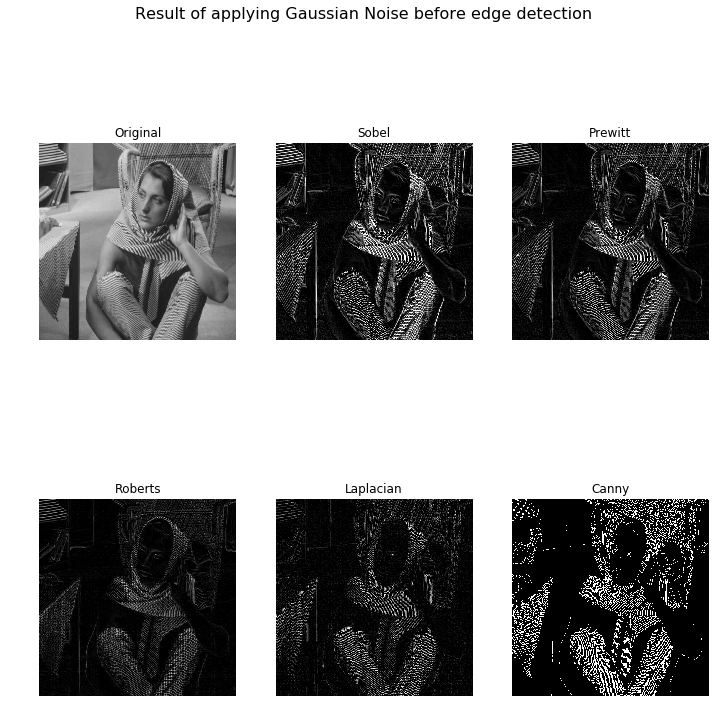

In [14]:
plt.figure(figsize=(12, 12))
noisy_gray=addGaussianNoise(gray)

plt.suptitle('Result of applying Gaussian Noise before edge detection', fontsize=16)

plt.subplot(2,3,1)
plt.axis('off')
plt.title('Original')
plt.imshow(rgb)

plt.subplot(2,3,2)
plt.axis('off')
plt.title('Sobel')
plt.imshow(applySobel(noisy_gray),cmap='gray')

plt.subplot(2,3,3)
plt.axis('off')
plt.title('Prewitt')
plt.imshow(applyPrewitt(noisy_gray),cmap='gray')

plt.subplot(2,3,4)
plt.axis('off')
plt.title('Roberts')
plt.imshow(applyRoberts(noisy_gray),cmap='gray')

plt.subplot(2,3,5)
plt.axis('off')
plt.title('Laplacian')
plt.imshow(applyLaplacian(noisy_gray),cmap='gray')

plt.subplot(2,3,6)
plt.axis('off')
plt.title('Canny')
plt.imshow(getEdges_Default(noisy_gray,50,150),cmap='gray')

#plt.tight_layout(rect=[0, 0.03, 0.1, 0.95])
#plt.subplots_adjust(top=0.1)
#fig.tight_layout()
plt.show()

 # <center>Question 2 -Prove that subtracting the Laplacian from an image is proportional to un-sharp masking </center>

*** Proof by Algorithm steps ***

![title](input_data\front.jpg)
![title](input_data\back.jpg)

*** Proof by implementation of algorithm ***

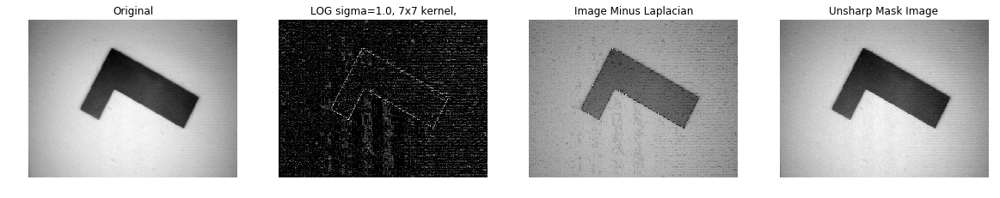

In [17]:
img = cv2.imread(r'./input_data/wdg4.jpg')
rgb,gray=getColorSpaces(img)

gray_minus_laplacian=gray-applyLaplacian(gray)
unsharp_mask_image=applyUnsharp(gray)
laplacian=applyLaplacian(gray)
plt.figure(figsize=(20, 20))

plt.subplot(1,4,1)
plt.axis('off')
plt.title('Original')
plt.imshow(gray,cmap='gray')

#Edges are identified
plt.subplot(1,4,2)
plt.axis('off')
plt.title('LOG sigma=1.0, 7x7 kernel,')
plt.imshow(3*laplacian,cmap='gray')

#Edges are sharper , but noise also increased
plt.subplot(1,4,3)
plt.axis('off')
plt.title('Image Minus Laplacian')
plt.imshow(gray_minus_laplacian,cmap='gray')


plt.subplot(1,4,4)
plt.axis('off')
plt.title('Unsharp Mask Image')
plt.imshow(unsharp_mask_image,cmap='gray')

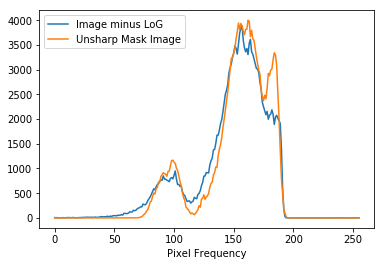

In [18]:
hist1=getHistogram(gray_minus_laplacian)
hist2=getHistogram(unsharp_mask_image)

plt.xlabel('Intensity Value')
plt.xlabel('Pixel Frequency')
plt.plot(hist1)
plt.plot(hist2)
plt.legend(['Image minus LoG','Unsharp Mask Image'], loc='upper left')

plt.show()

Therfore it is proved both by algorithm and the implementation that subtracting the Laplacian from an image is proportional to un-
sharp masking.

 # <center>Question 3  </center>
    
###  1. Create a matrix of size 3x3 which when convolved with box.png results in a white line where the white meets the black.

In [19]:
def applyCustomFilter(gray):
    
#     filterX = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])    
#     filterY = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

    filterX = np.array([[-1, 0, 1], 
                        [-1, 0, 1], 
                        [-1, 0, 1]])  

    filterY = np.array([[-1, -1, -1], 
                        [0, 0, 0],
                        [1, 1, 1]])


    gx = cv2.filter2D(gray, -1, filterX)
    gy = cv2.filter2D(gray, -1, filterY)
    #Calculate the gradient magnitude
    g = np.sqrt(gx * gx + gy * gy)
    #Normalize output to fit the range 0-255
    g *= 255.0 / np.max(g)
    
    return g,gx,gy

def applyCustomFilter2(gray,kernel):
    k=kernel.shape[0]
    padding=k//2

    w,h = gray.shape
    filtered = np.zeros(gray.shape)
    for i in range(padding,w-padding):
        for j in range(padding,h-padding):
            filtered[i,j] = np.sum(kernel*gray[i-padding:i+padding +1,j-padding:j+padding + 1])

    return filtered    

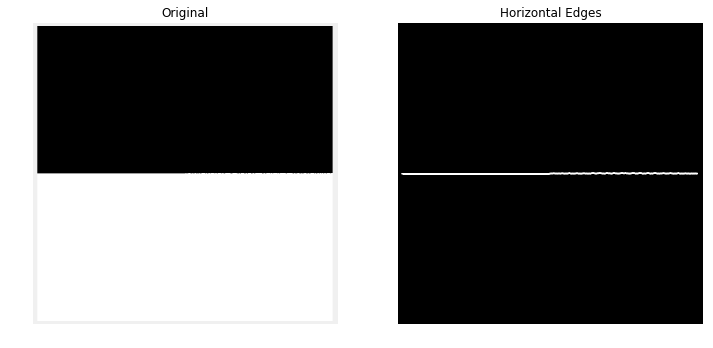

In [20]:
img = cv2.imread(r'./input_data/box.png')
plt.figure(figsize=(12, 12))
rgb,gray=getColorSpaces(img)


# edges_all,vertical_edge,horizontal_edge=applyCustomFilter(gray)

# filterX = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])   
# filterY = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

filterX = np.array([[-1, 0, 1], 
                    [-1, 0, 1], 
                    [-1, 0, 1]])  
    
filterY = np.array([[-1, -1, -1], 
                    [0, 0, 0],
                    [1, 1, 1]])


horizontal_edge=applyCustomFilter2(gray,filterY)
horizontal_edge=getNormalizedImage(horizontal_edge)

plt.subplot(121)
plt.axis('off')
plt.title('Original')
plt.imshow(rgb)

plt.subplot(122)
plt.axis('off')
plt.title('Horizontal Edges')
plt.imshow(horizontal_edge,cmap='gray')



###  2. Convolve blur.jpg with the above matrix and the transpose of the above matrix.Report your observations

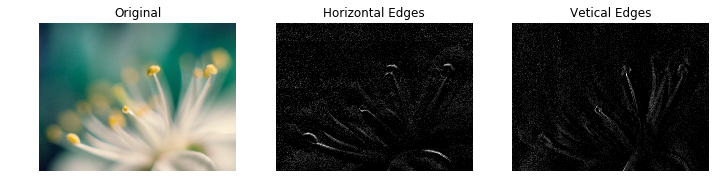

In [21]:
img = cv2.imread(r'./input_data/blur.jpg')
plt.figure(figsize=(12, 12))
rgb,gray=getColorSpaces(img)


horizontal_edge=applyCustomFilter2(gray,filterY)
horizontal_edge=getNormalizedImage(horizontal_edge)
vertical_edge=applyCustomFilter2(gray,filterX)
vertical_edge=getNormalizedImage(vertical_edge)

plt.subplot(131)
plt.axis('off')
plt.title('Original')
plt.imshow(rgb)

plt.subplot(132)
plt.axis('off')
plt.title('Horizontal Edges')
plt.imshow(horizontal_edge,cmap='gray')

plt.subplot(133)
plt.axis('off')
plt.title('Vetical Edges')
plt.imshow(vertical_edge,cmap='gray')

plt.show()


1. Derivative in X direction detecting vertical oriented edges
1. Derivative in Y direction detecting horizontal oriented edges
1. Combining both gives as all edges

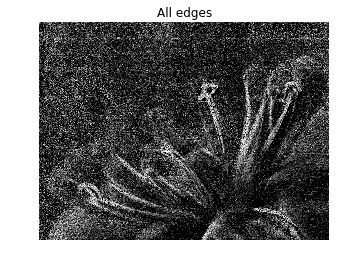

In [22]:
edges_all,_,_=applyCustomFilter(gray)
edges_all=getNormalizedImage(edges_all)
plt.axis('off')
plt.title('All edges')
plt.imshow(edges_all,cmap='gray')

###  3. Follow the above steps for suitable images of your choice.

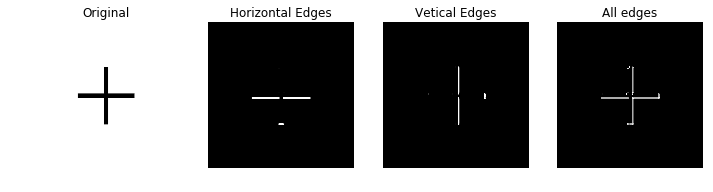

In [23]:
img = cv2.imread(r'./input_data/plus.png')

# img = cv2.imread(r'./input_data/cross_pattern.jpg')
plt.figure(figsize=(12, 12))
rgb,gray=getColorSpaces(img)

horizontal_edge=applyCustomFilter2(gray,filterY)
horizontal_edge=getNormalizedImage(horizontal_edge)

vertical_edge=applyCustomFilter2(gray,filterX)
vertical_edge=getNormalizedImage(vertical_edge)

edges_all,_,_=applyCustomFilter(gray)
edges_all=getNormalizedImage(edges_all)

plt.subplot(141)
plt.axis('off')
plt.title('Original')
plt.imshow(rgb)

plt.subplot(142)
plt.axis('off')
plt.title('Horizontal Edges')
plt.imshow(horizontal_edge,cmap='gray')

plt.subplot(143)
plt.axis('off')
plt.title('Vetical Edges')
plt.imshow(4*vertical_edge,cmap='gray')

plt.subplot(144)
plt.axis('off')
plt.title('All edges')
plt.imshow(10*edges_all,cmap='gray')

plt.show()

#  <center>Question 4 - High-Boost Filtering </center>

###  Implement high-boost filtering on the image bell.jpg varying the window size and the weight factor and report your observations.

This implementation is based on the formula

1. Edges = Original - LoG


2. Unsharp Mask
 High pass/Edges= Original - Low Pass (Gaussian,average etc)
 Sharp Image =Original+ k*Edges


3. High Boost = A*Original- Low Pass
             =A*Original-Original+Original- Low Pass
             =Original*(A-1)+(Original- Low Pass)
             =(A-1)*Original+High Pass
         


In [24]:
def getHighBoost(image,weight_factor,kernel_size=(5, 5)):
    
    sharpened_image = applyUnsharp(image,kernel_size)
    #if A = 1, it becomes it becomes “standard standard” Laplacian sharpening
    if weight_factor==1: 
        return sharpened_image
    highboost=(weight_factor-1)*image+sharpened_image
    highboost =getNormalizedImage(highboost)
    
    return highboost


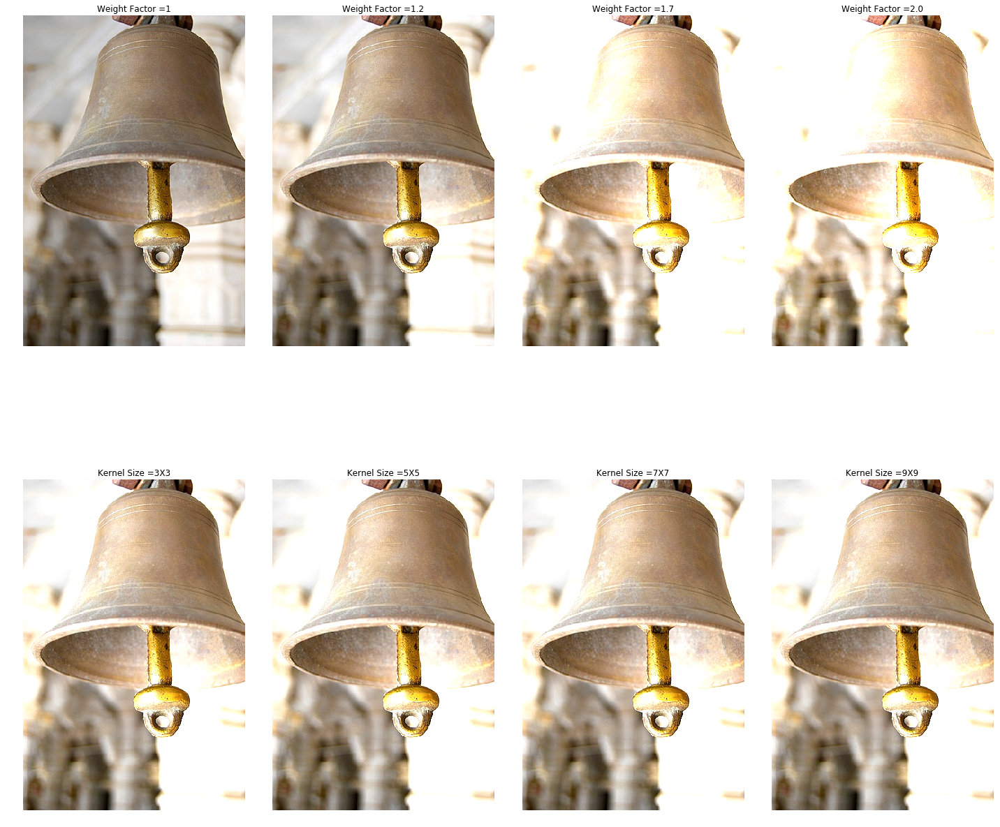

In [25]:
img = cv2.imread(r'./input_data/bell.jpg')
plt.figure(figsize=(20, 20))
rgb,gray=getColorSpaces(img)
lstA =[1,1.2,1.7,2.0]

num=0
for A in lstA:    
    plt.subplot(2,4,num+1) 
    plt.axis('off')
    plt.title('Weight Factor =' +str(A))  
    highboost=getHighBoost(rgb,A)      
    plt.imshow(highboost)
    num=num+1
   
A=1.4  
#num=0
for ks in range(3,11,2):    
    plt.subplot(2,4,num+1) 
    plt.axis('off')
    plt.title('Kernel Size =' +str(ks)+'X'+str(ks))  
    highboost=getHighBoost(rgb,A,(ks,ks))      
    plt.imshow(highboost)
    num=num+1
    
plt.tight_layout()   

1.  Increasing the wegith factor makeing the image bleached out
1. Edges are sharper by though kernel size is increased

ANother way to perform Highboost filtering is by using the below matrix
![title](input_data\highboost.jpg)

In [26]:
def getHighBoost2(image,A,val=1):
    
    if(val==1):
        filter1 = np.array([[0,-1,0],[-1,A+4,-1],[0,-1,0]])   
    if(val==2):   
        filter1 = np.array([[-1,-1,-1],[-1,A+8,-1],[-1,-1,-1]])   
    
    img1 = cv2.filter2D(image, -1, filter1)   
    
    return img1
def linContrastStretching(image_gray,a,b):    
    c = np.amin(image_gray)
    d = np.amax(image_gray)

    out_image =image_gray- c
    out_image *= int((b-a)/(d - c))
    out_image+=a
    
    return out_image

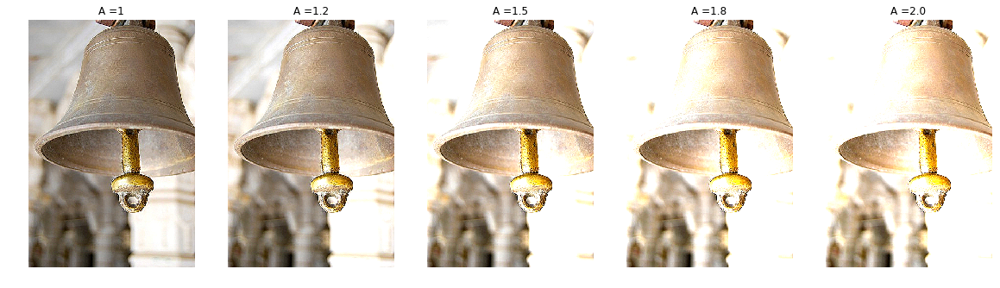

In [27]:
plt.figure(figsize=(20, 20))
lstA=[1,1.2,1.5,1.8,2.0]
num=0
for A in lstA:    
    plt.subplot(1,5,num+1) 
    plt.axis('off')
    plt.title('A =' +str(A))  
    
    highboost=getHighBoost2(rgb,A,1)     
    contrast_enhanced_img=linContrastStretching(highboost,0,255)
    plt.imshow(contrast_enhanced_img)
    num=num+1    

### Repeat the above exercise on suitable images of your choice.

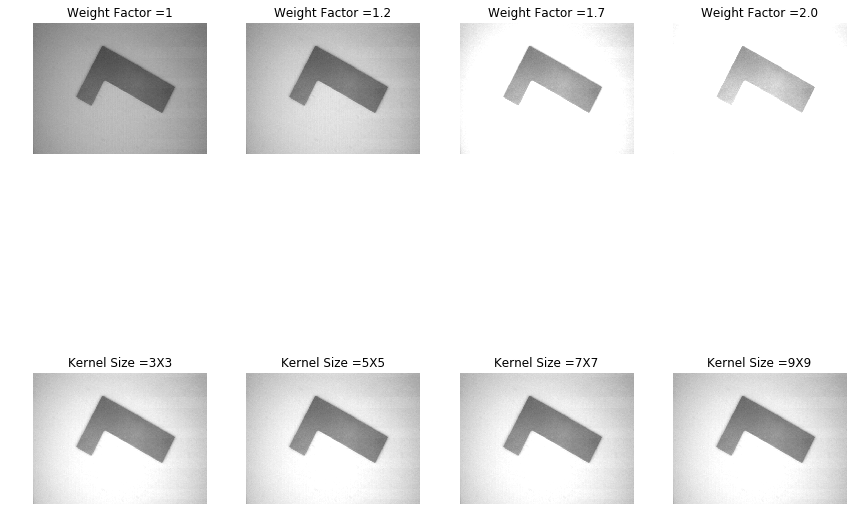

In [28]:
img = cv2.imread(r'./input_data/wdg4.jpg')
plt.figure(figsize=(12, 12))
rgb,gray=getColorSpaces(img)
lstA =[1,1.2,1.7,2.0]

num=0
for A in lstA:    
    plt.subplot(2,4,num+1) 
    plt.axis('off')
    plt.title('Weight Factor =' +str(A))  
    highboost=getHighBoost(rgb,A)      
    plt.imshow(highboost)
    num=num+1
   
A=1.4  
#num=0
for ks in range(3,11,2):    
    plt.subplot(2,4,num+1) 
    plt.axis('off')
    plt.title('Kernel Size =' +str(ks)+'X'+str(ks))  
    highboost=getHighBoost(rgb,A,(ks,ks))      
    plt.imshow(highboost)
    num=num+1
    
plt.tight_layout()   

### How is bilateral filtering different from high-boost flltering?

High-Boost:
<ul>
  <li>  Linear filter
  <li>  Faster compared to bilateral
  <li>  Single filter - Spatial
  <li>  Spatial weighted average
  <li>  Highlights sharp edges
</ul>    
Bilateral filter:
<ul>
   <li> Non-Linear filter
  <li>  Slower compared to highboost
  <li>  Two filters - Spatial + Range
  <li>  Spatial weighted average+ Intensity range of neighbors
   <li> Addresses intesity discontinuities (texture changes-coarse,mediam,rough)
  </ul>    

Edges are enhanced as well as texture retained


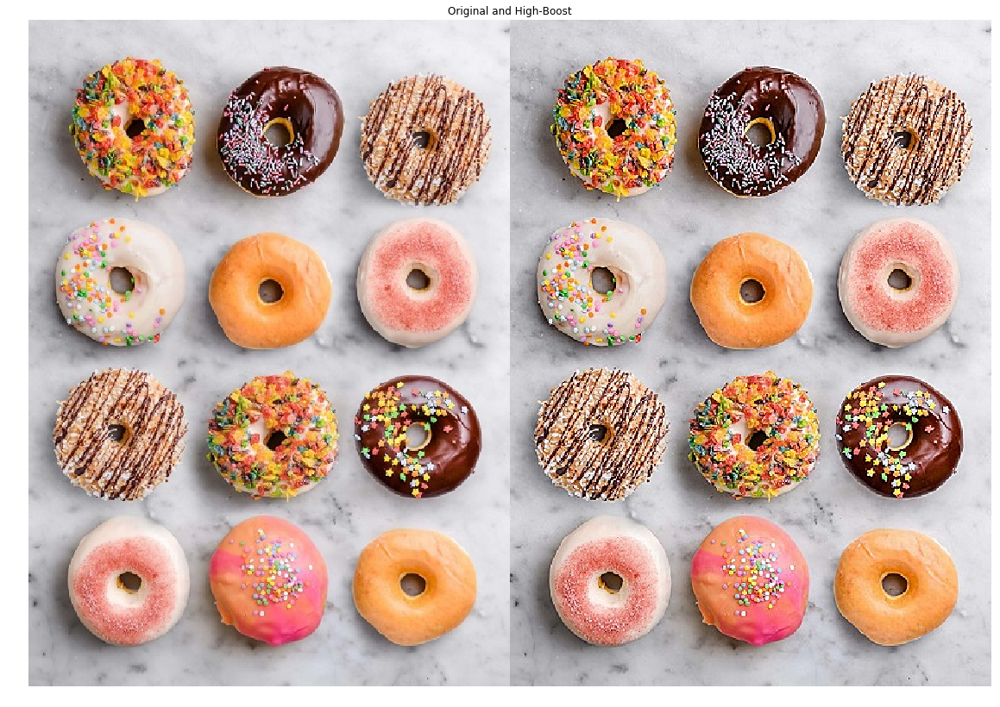

In [29]:
img = cv2.imread(r'./input_data/assorted.jpg')
plt.figure(figsize=(20, 20))
rgb,gray=getColorSpaces(img)

print('Edges are enhanced as well as texture retained')

plt.axis('off')
plt.title('Original and High-Boost')
plt.imshow(np.hstack((rgb, getHighBoost(rgb,1))))

Most of the fine texture has been filtered away, and yet all contours are as crisp
Donuts have assumed a graphics-like appearance, and the fine texture has gone


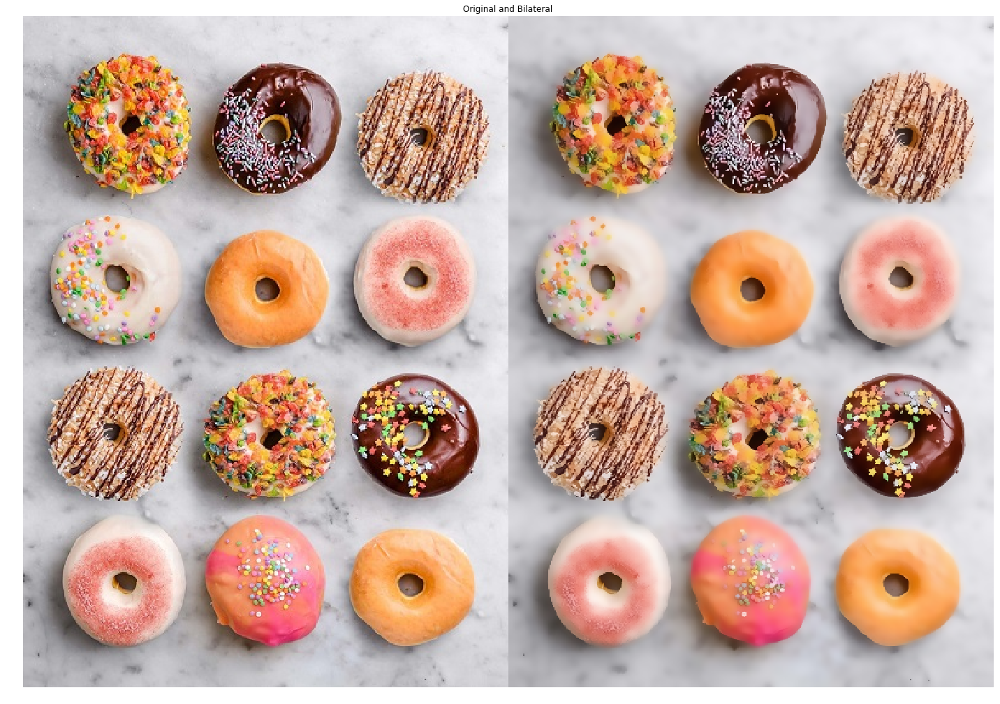

In [30]:
print('Most of the fine texture has been filtered away, and yet all contours are as crisp')
print('Donuts have assumed a graphics-like appearance, and the fine texture has gone')
plt.figure(figsize=(20, 20))
plt.axis('off')
plt.title('Original and Bilateral')
plt.imshow(np.hstack((rgb, cv2.bilateralFilter(rgb,9,75,75))))
plt.tight_layout()  

Edges are enhanced as well as texture retained-clearly seen on lemon slices,leaves,upma


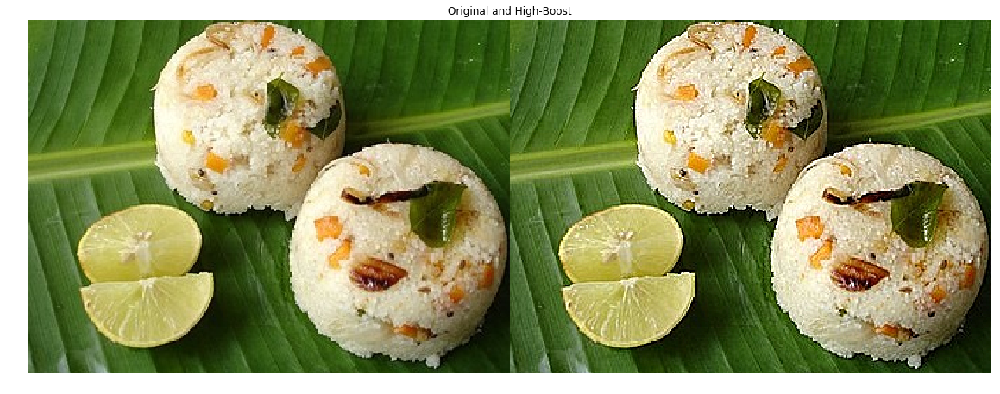

In [31]:
img = cv2.imread(r'./input_data/ravva_upma.jpg')
plt.figure(figsize=(20, 20))
rgb,gray=getColorSpaces(img)

print('Edges are enhanced as well as texture retained-clearly seen on lemon slices,leaves,upma')

plt.axis('off')
plt.title('Original and High-Boost')
plt.imshow(np.hstack((rgb, getHighBoost(rgb,1))))

Most of the fine texture has been filtered away, and yet all contours are as crisp
Upma,lemon interior have assumed a graphics-like appearance, and the fine texture has gone


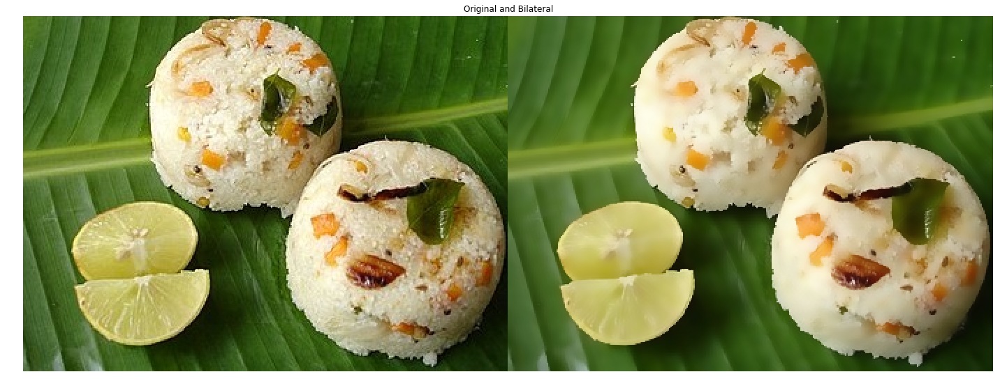

In [32]:
print('Most of the fine texture has been filtered away, and yet all contours are as crisp')
print('Upma,lemon interior have assumed a graphics-like appearance, and the fine texture has gone')
plt.figure(figsize=(20, 20))
plt.axis('off')
plt.title('Original and Bilateral')
plt.imshow(np.hstack((rgb, cv2.bilateralFilter(rgb,9,75,75))))
plt.tight_layout()  

#  <center>Question 5 - Faster implementation of linear spatial filters </center>

###  1. Implement an algorithm for low-pass filtering a grayscale image by moving a kXk averaging filter of the form ones(k)/(k^2). 


### 2.  As the filter is moved from one spatial location to the next one, the filter window shares many common pixels in adjacent neighborhoods. Exploit this observation and implement a more efficient version of averaging filter. To appreciate the benefits of doing so, generate a plot of k vs run-time for various sized images. The plot diagram should contain a line plot for each image size you pick. Use different marker types to distinguish the default implementation and improved implementation.

In [33]:
'''                 
Refered this material
https://jessicastringham.net/2017/12/31/stride-tricks/

'''
def applyFastFilter(gray, kernel):
    kernel = np.array(kernel)        
    view_shape = tuple(np.subtract(gray.shape, kernel.shape) + 1) + kernel.shape
    expanded_input  = as_strided(gray, shape = view_shape, strides = gray.strides * 2)  
    output=np.einsum('ij,ijkl->kl',kernel,expanded_input .T).T
    return output
    
def applyLowPass(gray,k,fastImplement=True):
    kernel = np.ones((k,k))/k*k
    padding=k//2
    if fastImplement:
        blur = applyFastFilter(gray,kernel)
        blur = np.pad(blur,(2,), 'constant')
    else:
        w,h = gray.shape
        blur = np.zeros(gray.shape)
        for i in range(padding,w-padding):
            for j in range(padding,h-padding):
                blur[i,j] = np.sum(kernel*gray[i-padding:i+padding +1,j-padding:j+padding + 1])
    
    return blur    

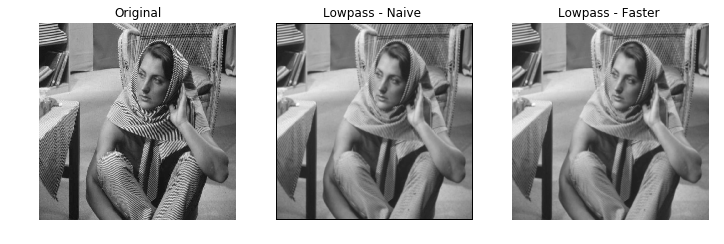

In [34]:
img = cv2.imread(r'./input_data/barbara.jpg')
plt.figure(figsize=(12, 12))
rgb,gray=getColorSpaces(img)

blurred_mage1 = applyLowPass(gray,7,False)
blurred_mage2 = applyLowPass(gray,7,True)
plt.subplot(1,3,1) 
plt.axis('off')
plt.title('Original') 
plt.imshow(gray,cmap='gray')
 
plt.subplot(1,3,2) 
plt.axis('off')
plt.title('Lowpass - Naive ')
plt.imshow(blurred_mage1,cmap='gray')

plt.subplot(1,3,3) 
plt.axis('off')
plt.title('Lowpass - Faster ')
plt.imshow(blurred_mage2,cmap='gray')

In [35]:

kvals=[k for k in range(3,19,2)]
times_naive=[]
times_fast=[]

for k in range(3,19,2):
    
    start = time.time()
    #Get naive implementation time
    blurred_mage = applyLowPass(gray,k,False)    
    end = time.time()
    times_naive.append(end-start)

    start = time.time()
    #Get faster implementation(strides of numpy)
    blurred_mage = applyLowPass(gray,k,True)    
    end = time.time()
    times_fast.append(end-start)


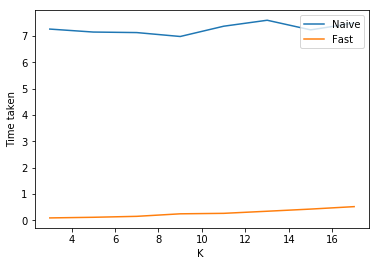

In [36]:
plt.xlabel('K ')
plt.ylabel('Time taken')

plt.plot(kvals,times_naive)
plt.plot(kvals,times_fast)
plt.legend(['Naive','Fast'], loc='upper right')

plt.show()

### 3. Utilize the observation similar to above to implement an effcient version of a kXk median filter. Generate a plot figure similar to previous question.

In [37]:
'''                 
Refered this material
https://jessicastringham.net/2017/12/31/stride-tricks/

'''
def applyFastFilterMedian(gray, kernel):
    view_shape = tuple(np.subtract(gray.shape, (k,k)) + 1) + (k,k)
    expanded_input = as_strided(gray, shape = view_shape, strides = gray.strides * 2)
    output=np.median(expanded_input,axis=(2,3))
    return output
    
def applyMedianFilter(gray,k,fastImplement=True):    
    padding=k//2
    if fastImplement:
        filtered_gray = applyFastFilterMedian(gray,k)
        filtered_gray = np.pad(filtered_gray,(2,), 'constant')
    else:
        h,w = gray.shape
        filtered_gray = np.zeros(gray.shape)
        for i in range(padding,w-padding):
            for j in range(padding,h-padding):
                filtered_gray[i,j] = np.median(gray[i-padding:i+padding +1,j-padding:j+padding + 1])
    return filtered_gray

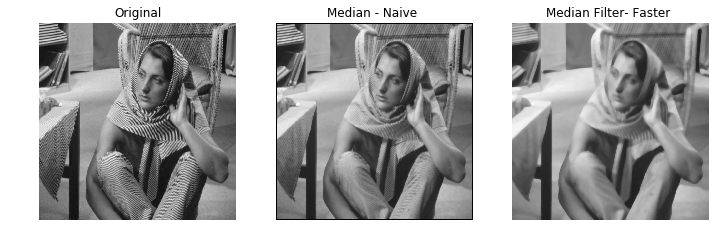

In [38]:
img = cv2.imread(r'./input_data/barbara.jpg')
plt.figure(figsize=(12, 12))
rgb,gray=getColorSpaces(img)

speckle_removed1 = applyMedianFilter(gray,7,False)
speckle_removed2 = applyMedianFilter(gray,7,True)
plt.subplot(1,3,1) 
plt.axis('off')
plt.title('Original') 
plt.imshow(gray,cmap='gray')
 
plt.subplot(1,3,2) 
plt.axis('off')
plt.title('Median - Naive ')
plt.imshow(speckle_removed1,cmap='gray')

plt.subplot(1,3,3) 
plt.axis('off')
plt.title('Median Filter- Faster ')
plt.imshow(speckle_removed2,cmap='gray')

kvals=[k for k in range(3,15,2)]
times_naive=[]
times_fast=[]

for k in range(3,15,2):
    
    start = time.time()
    #Get naive implementation time
    speckle_removed = applyMedianFilter(gray,k,False)    
    end = time.time()
    times_naive.append(end-start)

    start = time.time()
    #Get faster implementation(strides of numpy)
    speckle_removed = applyMedianFilter(gray,k,True)    
    end = time.time()
    times_fast.append(end-start)

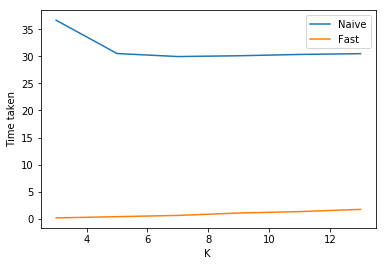

In [39]:
plt.xlabel('K ')
plt.ylabel('Time taken')

plt.plot(kvals,times_naive)
plt.plot(kvals,times_fast)

plt.legend(['Naive','Fast'], loc='upper right')

plt.show()

#  <center>Question 6 -Bilateral Filtering </center>

** Implement bilateral lter and apply it to sky.png and noir.png **

In [40]:
def applyBilateralFilter(gray,k,sigma_domain,sigma_range):
    padding=k//2
    h,w = getImageDimnesion(gray) 
    view_shape = tuple(np.subtract(gray.shape, (k,k)) + 1) + (k,k)
    # Create a gausian filter    
    gaussX,gaussY = np.meshgrid(np.linspace(-(padding),(padding),k),np.linspace(-(padding),(padding),k))    
    kernel_domain = np.exp(-(gaussX**2 + gaussY**2)/(2*(sigma_domain**2)))
    
    expanded_input = as_strided(gray, shape = view_shape, strides = gray.strides * 2)
    kernel_range = expanded_input -expanded_input[:,:,padding,padding][:,:,np.newaxis,np.newaxis]    
    kernel_range = np.exp(-kernel_range/(2*sigma_range**2))
    kernel = kernel_range * kernel_domain
    
    filtered_gray = np.sum(kernel*expanded_input,axis=(2,3))/np.sum(kernel,axis=(2,3))
    return filtered_gray


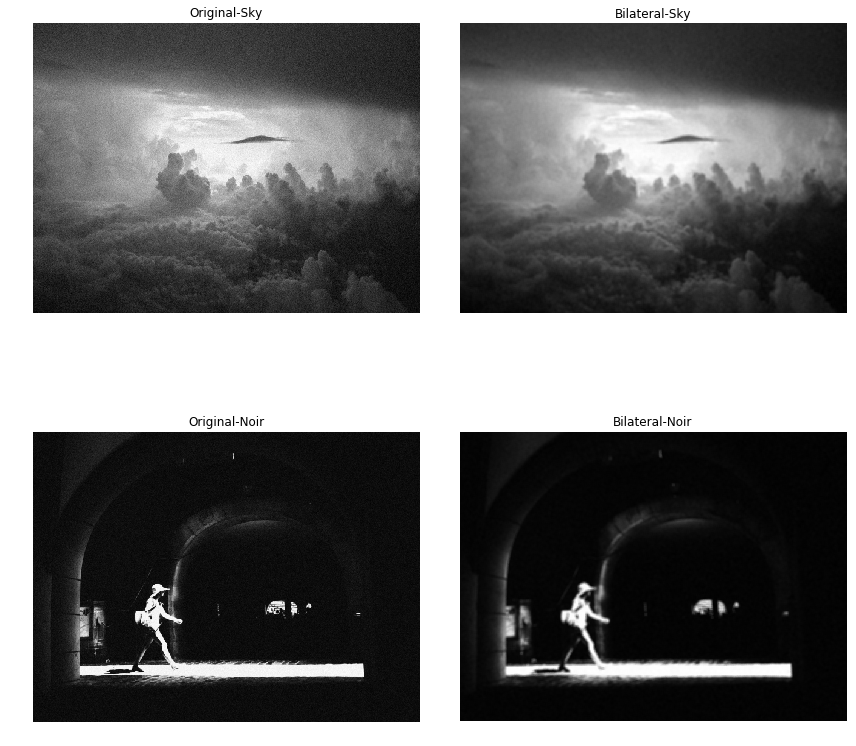

In [41]:
img = cv2.imread(r'./input_data/sky.png')
plt.figure(figsize=(12, 12))
rgb,gray=getColorSpaces(img)

sigma_domain=5
sigma_range=20
sky_bilateral=applyBilateralFilter(gray,5,sigma_domain,sigma_range)

plt.subplot(221)
plt.axis('off')
plt.title('Original-Sky')
plt.imshow(gray,cmap='gray')

plt.subplot(222)
plt.axis('off')
plt.title('Bilateral-Sky')
plt.imshow(sky_bilateral,cmap='gray')

img = cv2.imread(r'C:\SAI\IIIT\2019_Monsoon\DIP\Assignment2\input_data\noir.png')
rgb,gray=getColorSpaces(img)
noir_bilateral=applyBilateralFilter(gray,5,sigma_domain,sigma_range)

plt.subplot(223)
plt.axis('off')
plt.title('Original-Noir')
plt.imshow(gray,cmap='gray')

plt.subplot(224)
plt.axis('off')
plt.title('Bilateral-Noir')
plt.imshow(noir_bilateral,cmap='gray')
plt.tight_layout()

plt.show()


** Vary the effect of domain and range components of the bilateral filter and try to
minimize the L2 distance from the ground truth images. Display the images and
the approximate values for the sigma. **

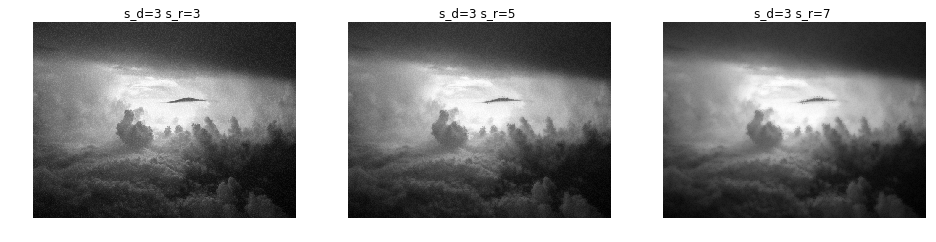

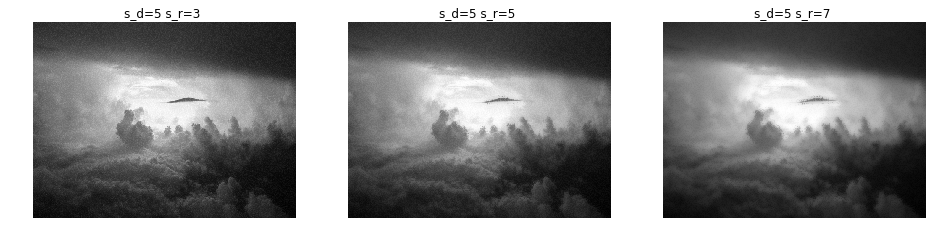

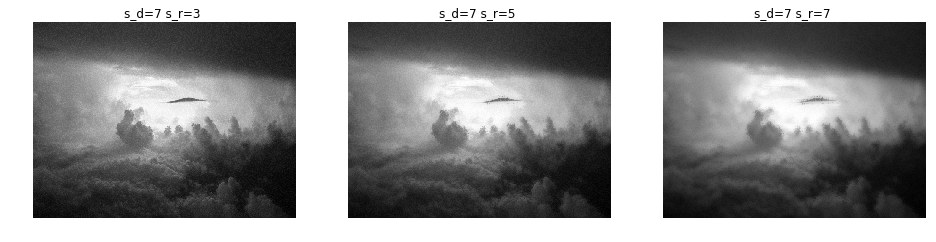

In [42]:
img_gt = cv2.imread(r'C:\SAI\IIIT\2019_Monsoon\DIP\Assignment2\input_data\gt_sky.png')
rgb_gt,gray_gt=getColorSpaces(img_gt)

img = cv2.imread(r'./input_data/sky.png')

rgb,gray=getColorSpaces(img)
  
    
vals = [3,5,7]
for i in range(3):
    fig = plt.figure(figsize=(16,8))
    for j in range(3):
        ax = fig.add_subplot(1,3,j + 1)
        sky_bilateral=applyBilateralFilter(gray,15,vals[i], vals[j])
        ax.imshow(sky_bilateral, cmap='gray')
        ax.axis('off')
        ax.set_title('s_d={} s_r={} '.format(vals[i],vals[j]))
plt.show()


#  <center>Question 7 - Faster implementation of linear spatial filters </center>

### Cross Bilateral Filter : In low light imaging, images tend to be noisy and loose sharp edges. However, with ash, there is an unpleasing direct-lighting effect.Thus a cross bilateral filter can be used with the range and spatial filters acting on two different images. Use a cross bilateral filter on the images potsash.jpg and pots_no_ash.jpg to produce the  output and report the parameters?

In [43]:
def getGaussianKernel(kernel_size=3,sigma=1.0):
    
    pad=kernel_size//2    
    ax=np.linspace(-pad,pad,kernel_size)
    ay=np.linspace(-pad,pad,kernel_size)    
    np.arange(2 * pad + 1) - pad
    X,Y = np.meshgrid(ax,ay)     
    kernel = np.exp(-(np.square(X)+np.square(Y))/(2*np.square(sigma)))

    return kernel

def applyCrossBilateralFilter(image1, image2, sigma_domain, sigma_range):
   pad = int(np.ceil(3 * sigma_domain))
   if image1.ndim == 3:  
       channels=3    
   if image1.ndim == 2:
       channels=2        
   h,w=getImageDimnesion(image1)
   image1_padded = getPaddedImage(image1,pad,channels,np.float32)
   image2_padded = getPaddedImage(image2,pad,channels,np.int32)
        
   output = np.zeros_like(image1)
  
    # A lookup table for range kernel
   
   LUT = np.exp(-np.arange(256) * np.arange(256) * 1 / (2 * sigma_range**2))
    # Generate a spatial Gaussian function
   x, y = np.meshgrid(np.arange(2 * pad + 1) - pad, np.arange(2 * pad + 1) - pad)
   
   kernel_domain = np.exp(-(x * x + y * y) * 1 / (2 * sigma_domain**2))
   
   if image1_padded.ndim == 2:
        for y in range(pad, pad + h):
            for x in range(pad, pad + w):
                W = LUT[np.abs(image2_padded[y - pad:y + pad + 1, x - pad:x + pad + 1] - image2_padded[y, x])] * kernel_domain
                output[y - pad, x - pad] = np.sum(W * image1_padded[y - pad:y + pad + 1, x - pad:x + pad + 1]) / np.sum(W)
                
   if image1_padded.ndim == 3 :  
        for y in range(pad, pad + h):
            for x in range(pad, pad + w):
                W = LUT[abs(image2_padded[y - pad:y + pad + 1, x - pad:x + pad + 1, 0] - image2_padded[y, x, 0])] * \
                      LUT[abs(image2_padded[y - pad:y + pad + 1, x - pad:x + pad + 1, 1] - image2_padded[y, x, 1])] * \
                      LUT[abs(image2_padded[y - pad:y + pad + 1, x - pad:x + pad + 1, 2] - image2_padded[y, x, 2])] * \
                      kernel_domain
                Waccum = np.sum(W)
                output[y - pad, x - pad, 0] = np.sum(W * image1_padded[y - pad:y + pad + 1, x - pad:x + pad + 1, 0]) / Waccum
                output[y - pad, x - pad, 1] = np.sum(W * image1_padded[y - pad:y + pad + 1, x - pad:x + pad + 1, 1]) / Waccum
                output[y - pad, x - pad, 2] = np.sum(W * image1_padded[y - pad:y + pad + 1, x - pad:x + pad + 1, 2]) / Waccum
   return output


Elapsed time: 5.385999 sec.


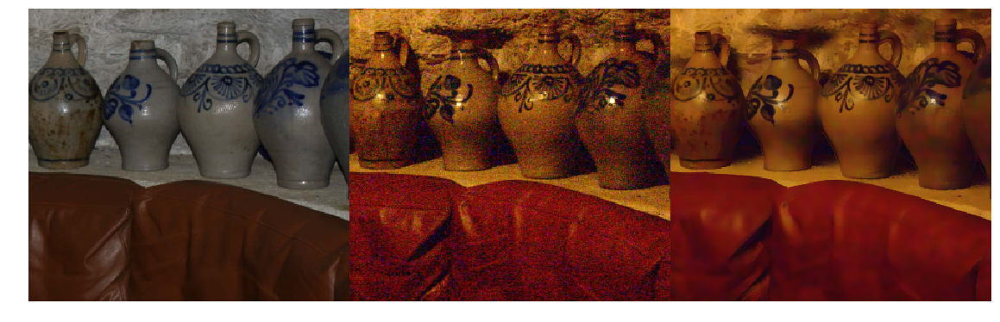

In [ ]:
plt.figure(figsize=(20, 20))
sigma_s = 3
sigma_r =10
img1 = cv2.imread(r'C:\SAI\IIIT\2019_Monsoon\DIP\Assignment2\input_data\pots_flash.jpg')
img1=getResizedImage(img1,40)
rgb1,gray1=getColorSpaces(img1)

img2 = cv2.imread(r'C:\SAI\IIIT\2019_Monsoon\DIP\Assignment2\input_data\pots_no_flash.jpg')
img2=getResizedImage(img2,40)
  
rgb2,gray2=getColorSpaces(img2)  
tic = time.time()
#img_bf = applyCrossBilateralFilter(gray2, gray1, sigma_s, sigma_r)
img_bf = applyCrossBilateralFilter(img2, img1, sigma_s, sigma_r)

toc = time.time()
print('Elapsed time: %f sec.' % (toc - tic))

rgb = cv2.cvtColor(img_bf,cv2.COLOR_BGR2RGB)
images = np.concatenate((rgb1, rgb2,rgb), axis=1)
#cv2.imwrite(r'C:\SAI\IIIT\2019_Monsoon\DIP\Assignment2\output_data\output1.png', images)
plt.axis('off')
plt.imshow(images)


In [ ]:
for sigma_r in range(1,25,5):
    for sigma_s in range(1,21,2):
        img_out = applyCrossBilateralFilter(img2, img1, sigma_s, sigma_r)
        
        filename = r"./output_data/file_%d_%d.jpg"%(sigma_r,sigma_s)
        img=np.concatenate((img1, img2,img_out), axis=1)
        print(filename)
        cv2.imwrite(filename, img)

./output_data/file_1_1.jpg
./output_data/file_1_3.jpg
./output_data/file_1_5.jpg
./output_data/file_1_7.jpg
./output_data/file_1_9.jpg
./output_data/file_1_11.jpg
./output_data/file_1_13.jpg


At sigma_r=1 and sigma_s=3 , the result looks better


** Inverse Bilateral Filter : Does it makes sense to develop an inverse bilateral filter, which blurs an image at edges and preserves the homogeneous regions. If it makes sense, design it and suggest its applications **

#  <center>Question 8 - Image Restoration </center>

### The image Degraded.jpg has been degraded in some way. Try to find out what kind of degradation has been applied on the image and try to restore it. The original image before degradation is Clean.jpg. Clearly explain what you did to restore the image.

In [ ]:
def applyMeanFilter(img,kernel_size):
    s=kernel_size[0]
    kernel = np.ones(kernel_size,np.float32)/(s*s)
    dst = cv2.filter2D(img,-1,kernel)    
    return dst

In [ ]:
img = cv2.imread(r'./input_data/Degraded.jpg')
plt.figure(figsize=(12, 12))
rgb,gray=getColorSpaces(img)

s=3
kernel_size=(s,s)

e1 = cv2.getTickCount()
rgb_mean = cv2.blur(rgb,(5,5))
e2 = cv2.getTickCount()
time_taken = (e2 - e1)/ cv2.getTickFrequency()
print(' Time taken for mean filter ' +str(time_taken))


rgb_mean=applyMeanFilter(rgb,kernel_size)


e1 = cv2.getTickCount()
rgb_gaussain = cv2.GaussianBlur(rgb,(5,5),0)
e2 = cv2.getTickCount()
time_taken = (e2 - e1)/ cv2.getTickFrequency()

print(' Time taken for Gaussian filter ' +str(time_taken))

e1 = cv2.getTickCount()
rgb_median = cv2.medianBlur(rgb,5)
e2 = cv2.getTickCount()
time_taken = (e2 - e1)/ cv2.getTickFrequency()
print(' Time taken for Median filter ' +str(time_taken))

e1 = cv2.getTickCount()
rgb_bilateral = cv2.bilateralFilter(rgb_mean,3,1,1)
e2 = cv2.getTickCount()
time_taken = (e2 - e1)/ cv2.getTickFrequency()
print(' Time taken for Bilateral filter ' +str(time_taken))

plt.subplot(2,2,1) 
plt.axis('off')
plt.imshow(rgb)
plt.title('Original')  

plt.subplot(2,2,2) 
plt.axis('off')
plt.imshow(rgb_mean)
plt.title('Mean ' +str(s)+'X'+str(s))  

plt.subplot(2,2,3) 
plt.axis('off')
plt.imshow(rgb_gaussain)
plt.title('Gaussian ')  

plt.subplot(2,2,4) 
plt.axis('off')
plt.imshow(rgb_median)
plt.title('Median' )  

# plt.subplot(1,5,5) 
# plt.axis('off')
# plt.imshow(rgb_bilateral)
# plt.title('Bilateral')  


plt.tight_layout()
plt.show()

***  Degraded image is indicative of SALT-AND-PEPPER type of Noise ***
 1.  Applied Median filter to restore the image per the below mentioned reasons

**Observations**
1. Mean filter reduced the noise . Image getting blurred by increasing the kernel size.When the filter neighborhood applied an edge, the filter interpolating new values for pixels on the edge blurring those edges. Overall impact is 'softening' the image.
2. Gaussian providing gentler smoothing and preserving edges better than a same sized mean filter. 
    -Gaussian did not eliminate salt-and-pepper noise
3. The median is calculated by first sorting all the pixel values from the surrounding neighborhood into numerical order and then replacing the pixel being considered with the middle pixel value.Since the median value must actually be the value of one of the pixels in the neighborhood, the median filter does not create new unrealistic pixel values when the filter straddles an edge. For this reason the median filter is much better at preserving sharp edges than the mean filter.
  <ul>
    <li>Expensive to compute when compared to Mean or Gaussian filter
 <li>Has to sort values within the kernel each time .
  <li>For Salt-and-pepper noise,  mean filtering or Gaussian smoothing is relatively unsuccessful because the corrupted pixel value can vary significantly from the original and therefore the mean can be significantly different from the true value.
  <li>A median filter removed drop-out noise(0 or 255) more efficiently and at the same time preserved the edges and small details in the image better. 
  <li>In the image , building roof edges are sharper(preserved) in Median filtered but looks blurren in Gaussian filtered 
  </ul>



In [ ]:
plt.figure(figsize=(12, 12))
images = np.concatenate((rgb_median, rgb_gaussain), axis=1)
plt.imshow(images)
plt.title('Median on left and Gaussian on right' )  
plt.axis('off')

plt.show()